## Librerias

In [ ]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import skimage.color as sc
import os
import kagglehub
import pandas as pd
import random

/tmp/ipython-input-1266022670.py:9: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import convolve
/tmp/ipython-input-1266022670.py:10: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
/tmp/ipython-input-1266022670.py:11: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


## Dataset

In [11]:
import kagglehub
durjoychandrapaul_objectnature_images_to_perform_dip_path = kagglehub.dataset_download('durjoychandrapaul/objectnature-images-to-perform-dip')

print('Data source import complete.')

Using Colab cache for faster access to the 'objectnature-images-to-perform-dip' dataset.
Data source import complete.


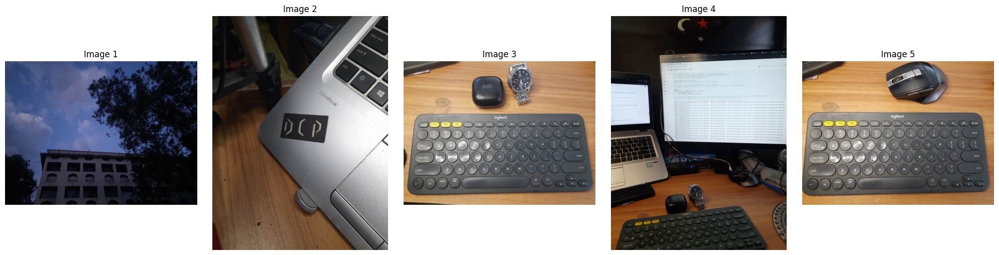

In [12]:
image_files = []
for root, dirs, files in os.walk(durjoychandrapaul_objectnature_images_to_perform_dip_path):
    for file in files:
        if file.endswith(('.jpg', '.jpeg', '.png')):
            image_files.append(os.path.join(root, file))

image_files.sort()

plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_files))):
    img_path = image_files[i]
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f'Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Sobel edge detection

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_ce_building.jpg


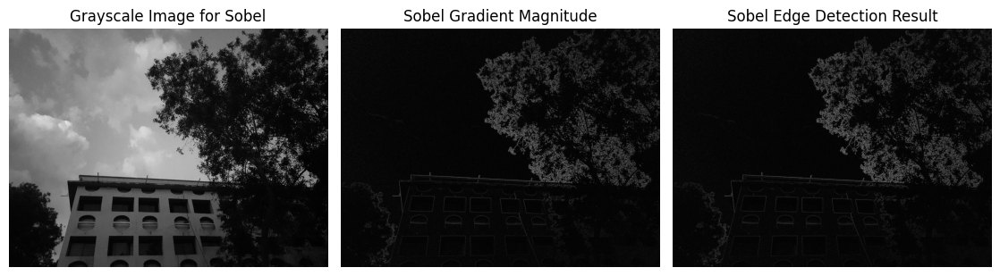

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_dcp.jpg


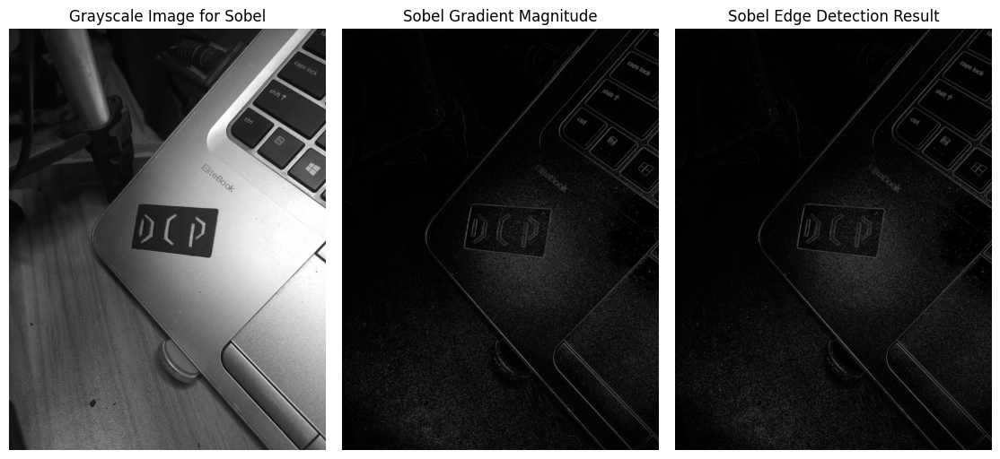

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_keyboard_watch_qcy.jpg


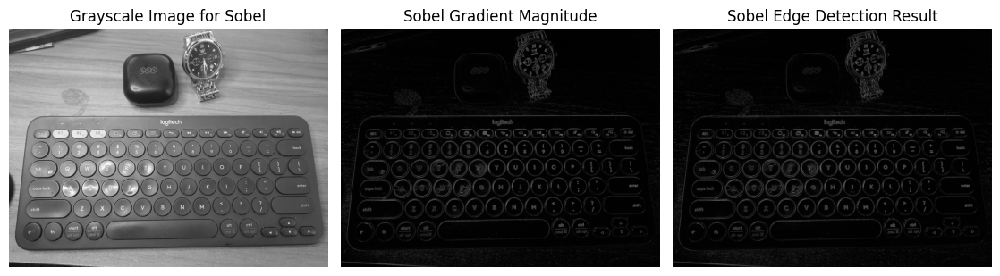

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_monitor.jpg


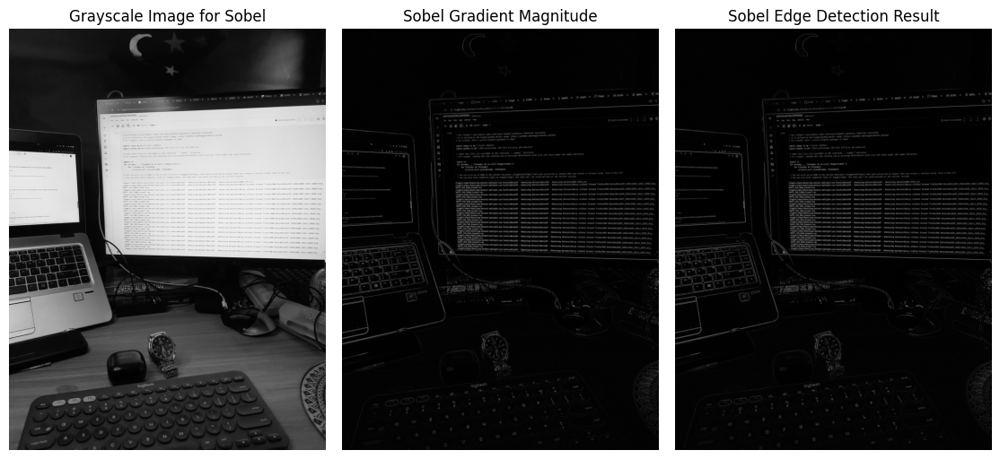

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_mouse_keyboard.jpg


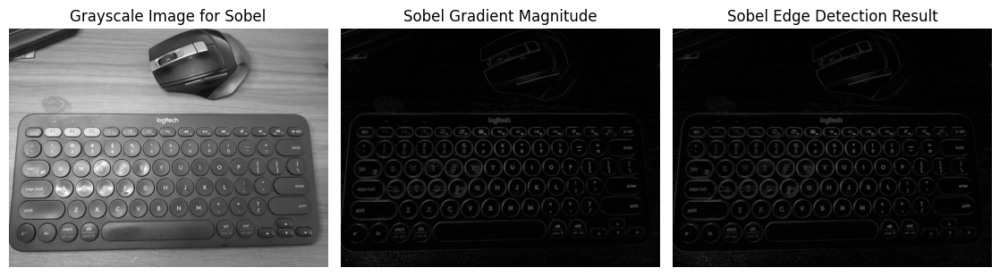

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_nature.jpg


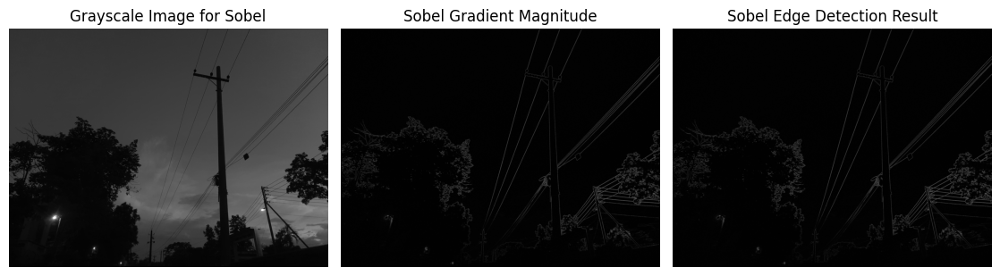

Processing image: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_tree.jpg


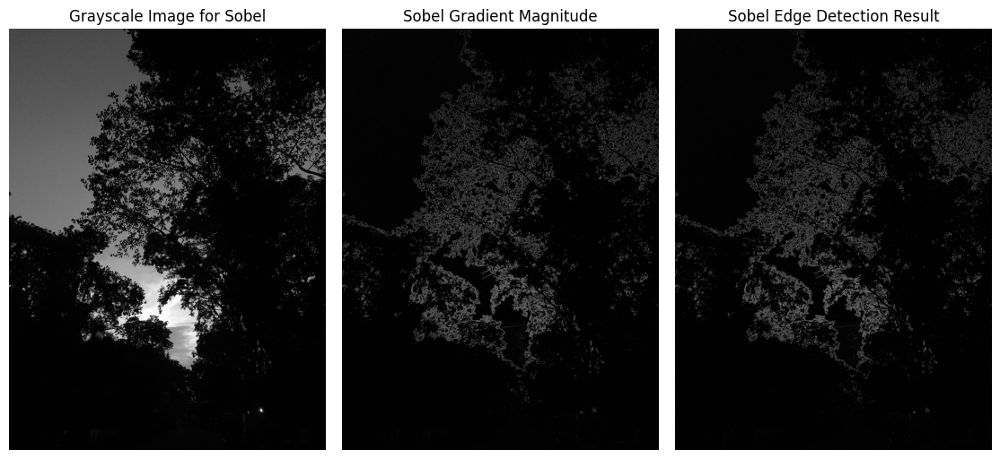

Processing image: /kaggle/input/objectnature-images-to-perform-dip/retouch/20240525_184924 (2).jpg


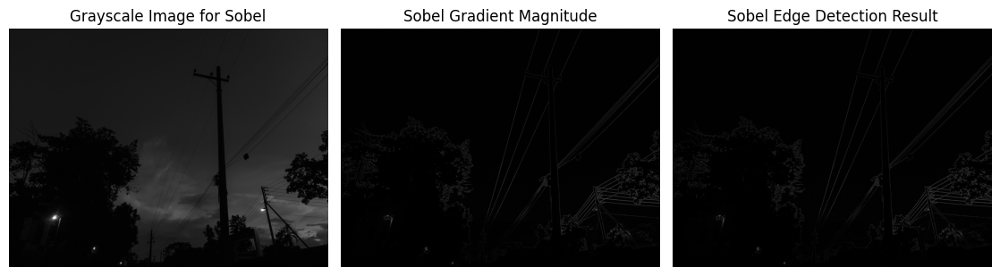

Processing image: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_dcp_retouch.png


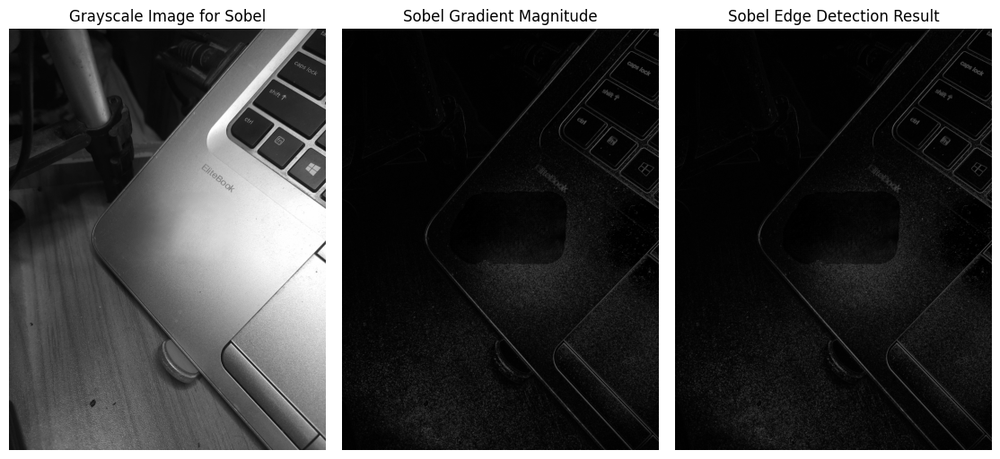

Processing image: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_keyboard_watch_qcy_retouch.jpg


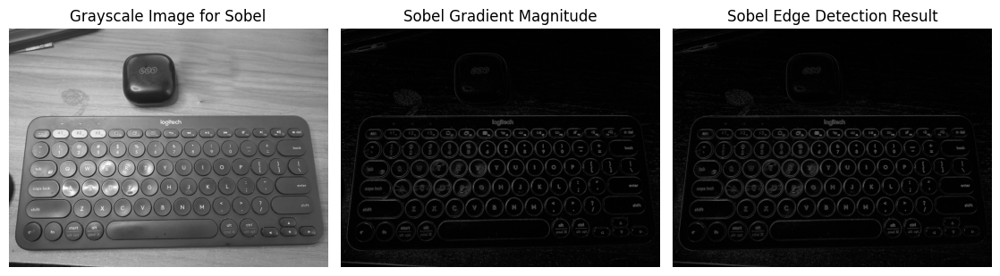

Processing image: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_keyboard_watch_retouch.jpg


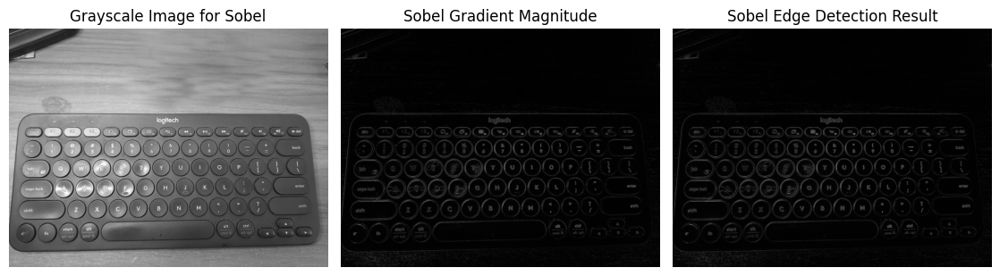

Processing image: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_monitor_retouch.jpg


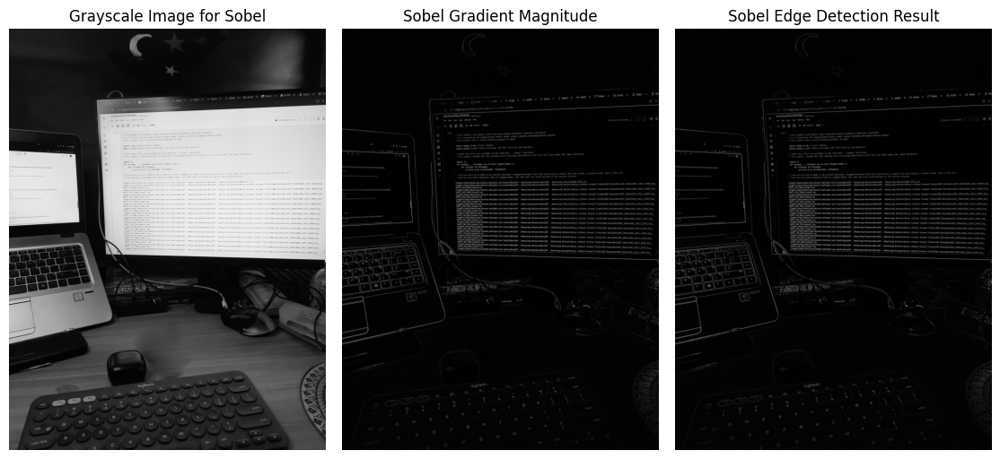

In [16]:
for img_path in image_files:
    current_image_bgr = cv2.imread(img_path)
    if current_image_bgr is None:
        print(f"Warning: Could not read image {img_path}")
        continue
    current_image = cv2.cvtColor(current_image_bgr, cv2.COLOR_BGR2RGB)
    print(f"Processing image: {img_path}")

    # 1. Grayscale
    img_gray_sobel = skimage.color.rgb2gray(current_image)
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 4, 1)
    plt.imshow(img_gray_sobel, cmap="gray")
    plt.title("Grayscale Image for Sobel")
    plt.axis('off')

    # 2. Gradients
    dx = ndimage.sobel(img_gray_sobel, axis=1)
    dy = ndimage.sobel(img_gray_sobel, axis=0)

    mag = np.hypot(dx, dy)
    plt.subplot(1, 4, 2)
    plt.imshow(mag, cmap="gray")
    plt.title("Sobel Gradient Magnitude")
    plt.axis('off')

    # 3. Normalize gradient values
    if np.amax(mag) > 0:
        mag_normalized = mag * (255.0 / np.amax(mag))
    else:
        mag_normalized = mag

    img_edge_sobel = mag_normalized.astype(np.uint8)
    plt.subplot(1, 4, 3)
    plt.imshow(img_edge_sobel, cmap="gray")
    plt.title("Sobel Edge Detection Result")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

## Canny edge detection

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_ce_building.jpg


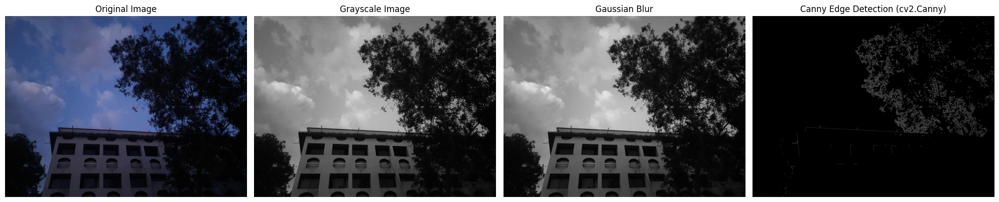

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_dcp.jpg


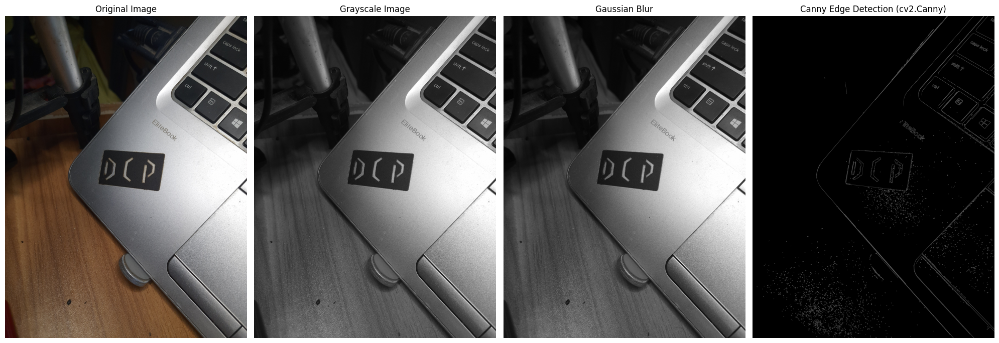

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_keyboard_watch_qcy.jpg


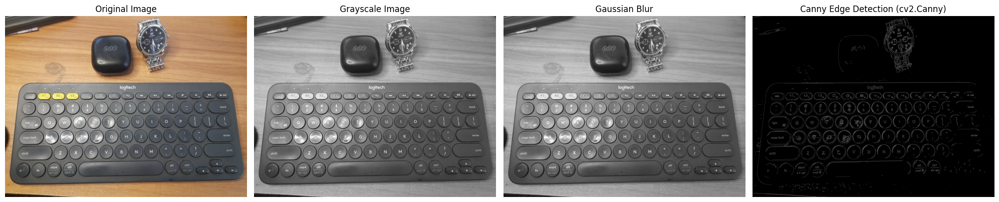

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_monitor.jpg


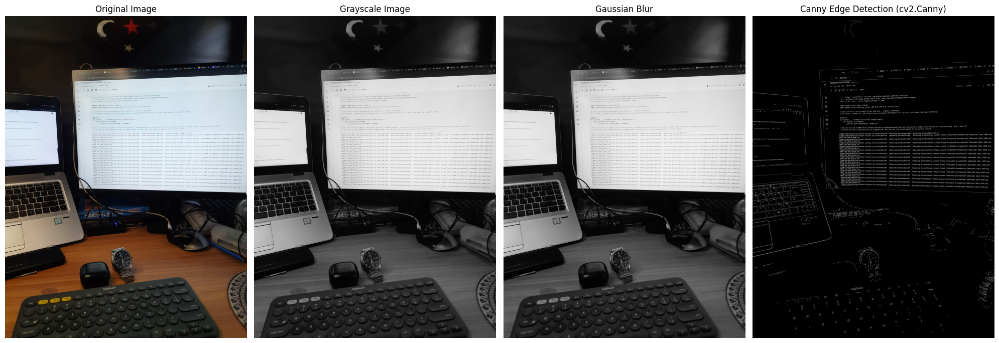

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_mouse_keyboard.jpg


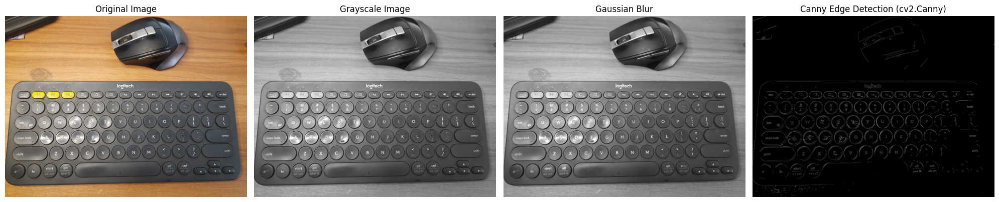

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_nature.jpg


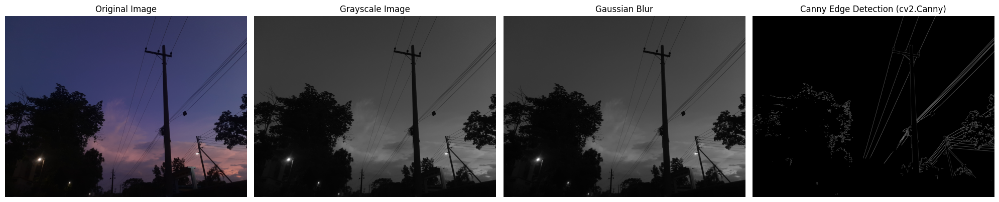

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/orginal/Durjoy_DCP_image_dataset_14_tree.jpg


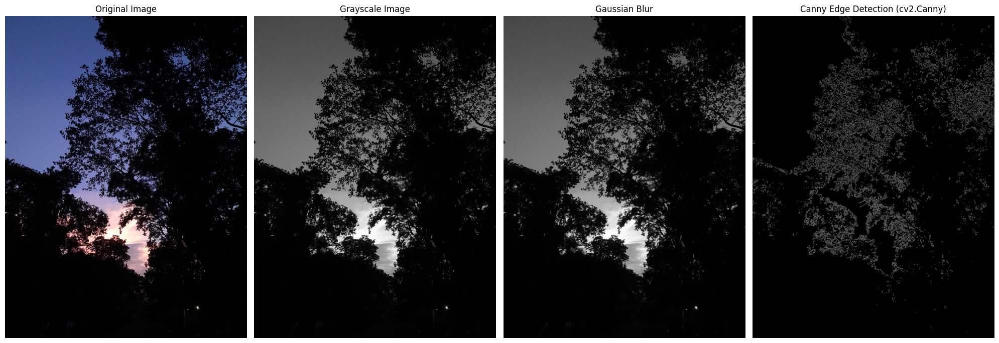

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/retouch/20240525_184924 (2).jpg


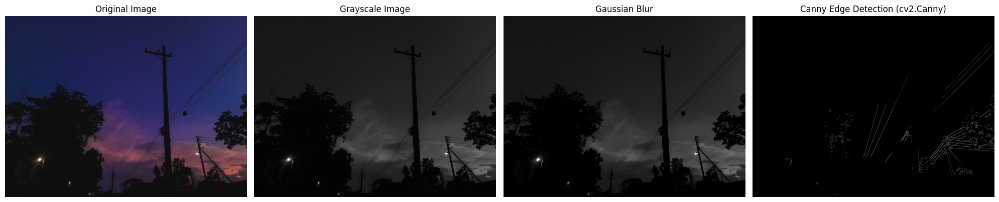

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_dcp_retouch.png


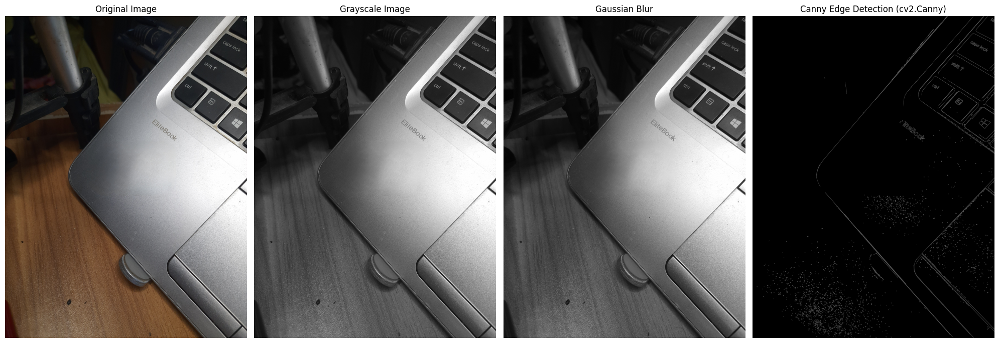

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_keyboard_watch_qcy_retouch.jpg


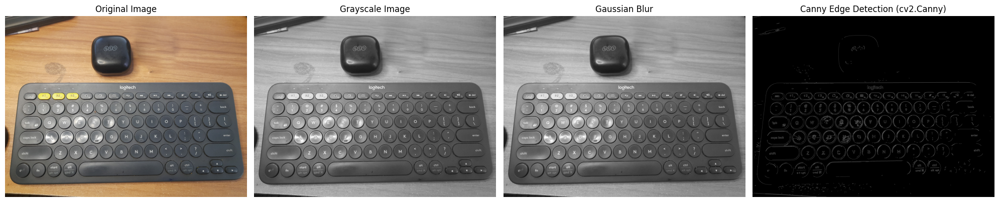

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_keyboard_watch_retouch.jpg


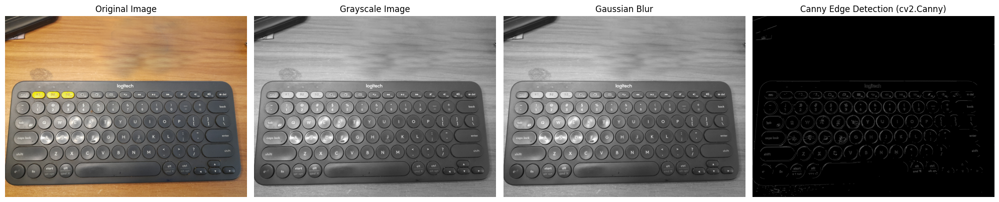

Processing image for Canny using cv2.Canny: /kaggle/input/objectnature-images-to-perform-dip/retouch/Durjoy_DCP_image_dataset_14_monitor_retouch.jpg


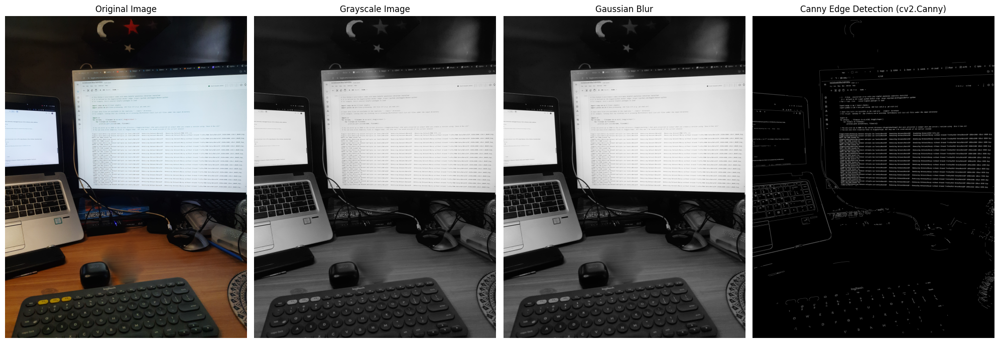

In [13]:
def sobel_filters_cv2(img):
    Ix = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
    Iy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
    G = np.hypot(Ix, Iy)
    theta = np.arctan2(Iy, Ix)
    return (G, theta)

def non_max_suppression_cv2(img, D):
    pass

def threshold_cv2(img, lowThresholdRatio, highThresholdRatio):
    pass

def hysteresis_cv2(img, weak, strong):
    pass


for img_path in image_files:
    current_image_bgr = cv2.imread(img_path)
    if current_image_bgr is None:
        print(f"Warning: Could not read image {img_path}")
        continue
    current_image = cv2.cvtColor(current_image_bgr, cv2.COLOR_BGR2RGB)
    print(f"Processing image for Canny using cv2.Canny: {img_path}")

    # 1. Grayscale
    img_gray_canny = cv2.cvtColor(current_image_bgr, cv2.COLOR_BGR2GRAY)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 4, 1)
    plt.imshow(current_image, cmap="gray")
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(img_gray_canny, cmap="gray")
    plt.title("Grayscale Image")
    plt.axis('off')

    # 2. Gaussian blur for noise reduction
    img_gaussian_canny = cv2.GaussianBlur(img_gray_canny, (5, 5), 0)
    plt.subplot(1, 4, 3)
    plt.imshow(img_gaussian_canny, cmap="gray")
    plt.title("Gaussian Blur")
    plt.axis('off')

    # Canny edge detection
    edges = cv2.Canny(img_gaussian_canny, 100, 200)

    plt.subplot(1, 4, 4)
    plt.imshow(edges, cmap="gray")
    plt.title("Canny Edge Detection (cv2.Canny)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()